<a href="https://colab.research.google.com/github/luccrornin/Cardiovascular-Pathology-Classifier/blob/main/BalancingECG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import butter, filtfilt
import test

In [2]:
def scale_input(input_data, input_min, input_max, output_min, output_max):
    """
    Scale the input data to a specified output range.

    Args:
        input_data (ndarray): Input data to be scaled.
        input_min (float): Minimum value of the input data.
        input_max (float): Maximum value of the input data.
        output_min (float): Desired minimum value of the output range.
        output_max (float): Desired maximum value of the output range.

    Returns:
        ndarray: Scaled input data.
    """
    scaled_data = ((input_data - input_min) / (input_max - input_min)) * (output_max - output_min) + output_min
    return scaled_data

In [3]:
def buter(mv_file):
    """
    This function implements a butterworth filter with
    an order of 3,
    a low cut-off of 0.4Hz,
    a high cut-off of 45Hz,
    a sampling rate of 360Hz.
    :return: The filtered data in a numpy array.
    """
    order = 3
    low_cut = 0.4
    high_cut = 45
    sampling_rate = 360
    nyq = 0.5 * sampling_rate
    low = low_cut / nyq
    high = high_cut / nyq
    coef = butter(order, [low, high], btype='band')
    a = coef[0]
    b = coef[1]

    df = pd.read_csv(mv_file)
    index = np.asarray(df.iloc[:, 0])
    mv_readings = np.asarray(df.iloc[:, 1:])
    filtered_data = filtfilt(a, b, mv_readings, axis=0)
    filtered_df = np.insert(filtered_data, 0, index, axis=1)

    return filtered_df

In [4]:
def old_read_in_csv(mv_file, annotations_file):
    """
    This function reads in 2 csv files and returns 1 dataframe.
    :param mv_file: The csv file containing the mv readings for the whole ambulatory ECG scan.
    :param annotations_file: The csv file containing the annotations for the ambulatory ECG scan.
    :return: The dataframe containing the mv readings and the annotations as a numpy array & a list of the types.
    Data Frame Structure:
    The returned data frame consists of [sample_index][mv_readings = 0|annotation = 1][tuples of channels]
    [Channel 1 or 2|Type] & the types of heartbeats in a list.
    """
    # mv_readings structure: #sample, Signal reading 1, Signal reading 2
    # there are 650k samples.
    buttery_mv_df = buter(mv_file)  # This is the filtered data, using the butterworth filter.

    # annotations structure: Time   Sample #  Type  Sub Chan  Num
    # there are 2275 annotations.
    annotations_cols = ['Time', 'Sample', 'Type', 'Sub', 'Chan', 'Num']
    annotations = pd.read_csv(annotations_file, usecols=annotations_cols)
    # the last 3 columns are not needed, so we need a new df with only the first 3 columns
    annotations = annotations.iloc[:, :3]

    train_data = []
    heartbeat_types = []
    upper_bound = 0
    lower_bound = 0
    for i in range(len(annotations)):
        sample_row_x = []  # This is the time series of a heartbeat
        sample_row_y = []  # This is the annotation of the heartbeat
        upper_bound = annotations.iloc[i]['Sample']
        # if we see a type of heartbeat that we have not seen before, we add it to the list of heartbeat types
        if annotations.iloc[i]['Type'] not in heartbeat_types:
            heartbeat_types.append(annotations.iloc[i]['Type'])

        sample_row_y.append(annotations.iloc[i]['Type'])

        # Run through the mv readings and append the readings to the sample_row_x as tuples of (channel 1, channel 2)
        for j in range(lower_bound, upper_bound):
            sample_row_x.append((buttery_mv_df[j][1], buttery_mv_df[j][2]))

        train_data.append([sample_row_x, sample_row_y])
        lower_bound = upper_bound + 1

    return train_data, heartbeat_types

In [5]:
def read_in_csv(mv_file, annotations_file):
    # So this currently is a numpy matrix with shape (650_000, 3)
    # The columns will be filtered with a butterworth filter.
    butter_df = buter(mv_file)

    # something = np.delete(butter_df, 0, axis=1)
    # something = something[:159 + 1, :]
    # test.plot_input_data(something, "Filtered Data")

    # The MV readings now need to be scaled to be between -1 and 1.
    # We get the overall min & max of the MV readings.
    overall_min = min(np.min(butter_df[:, 1]), np.min(butter_df[:, 2]))
    overall_max = max(np.max(butter_df[:, 1]), np.max(butter_df[:, 2]))

    # Get the columns as numpy arrays.
    mlii = butter_df[:, 1]
    v5 = butter_df[:, 2]

    # Scale the columns.
    mlii = scale_input(mlii, overall_min, overall_max, -1, 1)
    v5 = scale_input(v5, overall_min, overall_max, -1, 1)

    # other = np.column_stack((mlii, v5))
    # other = other[:159 + 1, :]
    # test.plot_input_data(other, "Scaled & Filtered Data")

    # Put the scaled columns back into the butter_df.
    butter_df = np.column_stack((butter_df[:, 0], mlii, v5))

    # annotations structure: Time   Sample #  Type  Sub Chan  Num
    # there are 2,275 annotations.
    #annotations_cols = ['Time', 'Sample #', 'Type', 'Sub', 'Chan', 'Aux']
    annotations = pd.read_csv(annotations_file)

    # the last 3 columns are not needed, so we need a new df with only the first 3 columns
    # The shape of the annotations is (2_039, 3)
    annotations = annotations.iloc[:, :3]

    train_data = []
    label_data = []
    heartbeat_types = []

    upper_bound = 0
    lower_bound = 0

    # This loop iterates loops over the annotation file, giving indications of the labels and the bound of the
    # heartbeats
    for i in range(annotations.shape[0]):
        # If the heartbeat is not in the list of heartbeat types, add it to the list.
        if annotations.iloc[i][2] not in heartbeat_types:
            heartbeat_types.append(annotations.iloc[i][2])

        label_data.append(annotations.iloc[i][2])

        heartbeat_sequence = []
        upper_bound = annotations.iloc[i][1]
        for pair in range(lower_bound, upper_bound):  # The value at the upper bound is not included.
            # inspect later if converting the pair into a np array is necessary.
            channel_readings = [butter_df[pair][1], butter_df[pair][2]]
            heartbeat_sequence.append(np.asarray(channel_readings))

        train_data.append(np.asarray(heartbeat_sequence))
        lower_bound = upper_bound + 1

    print(f'\033[36mThe training data, label data and heartbeat types have been read in.\n')
    return train_data, label_data, heartbeat_types

In [6]:
def generate_y_target(label_data, heartbeat_types):
    """
    This function will generate the one hot encoding for the labels, which will be the target for the model.
    :param label_data: The list of labels for the training data, each label corresponds to a heartbeat sequence.
    :param heartbeat_types: The list of all the different heartbeat types. The one hot encoding will be based on this.
    :return: A matrix of shape (len(label_data), len(heartbeat_types)) where each row is a
    one hot encoding of the label.
    """
    y_target = np.zeros((len(label_data), len(heartbeat_types)))
    for i in range(len(label_data)):
        y_target[i][heartbeat_types.index(label_data[i])] = 1

    return y_target

In [7]:
def split_into_types(data, heartbeat_types, label_data):
    """
    This function splits the data into the different types of heartbeats.
    :param data: The data to be split.
    :param heartbeat_types: The types of heartbeats in the data.
    :param label_data:

    :return: A list of lists, where each list is a type of heartbeat.
    """
    # the classes are N, A, a, J, V, F, j, p
    classes = []
    for i in range(len(heartbeat_types)):
        classes.append([])

    for i in range(len(data)):
        beat = label_data[i]
        if beat in heartbeat_types:
            classes[heartbeat_types.index(beat)].append(data[i])

    return classes

In [8]:
def get_avg_seq_length(train_data):
    """
    This function calculates the average length of the sequences in the training data.
    :param train_data: The training data.
    :return: The average length of the sequences in the training data.
    """
    # Calculate the number of sequences in the training data.
    num_sequences = len(train_data)
    # Calculate the total length of the sequences in the training data.
    total_length = 0
    for sequence in train_data:
        total_length += len(sequence)
    # Calculate the average length of the sequences in the training data.
    avg_seq_length = total_length / num_sequences
    # Return the average length of the sequences in the training data.
    return avg_seq_length

In [9]:
def count_classe_instances(label_data, heartbeat_types):
    """
    This function counts the number of instances of each type of heartbeat in the data.
    :param label_data: The labels for each heartbeat sequence in the training data.
    :param heartbeat_types: The types of heartbeats in the data.
    :return: returns a list as long as there are types of heartbeats. Each index corresponds to the instance of a type.
    """
    # the classes are N, A, a, J, V, F, j, p
    classes_counts = np.zeros(len(heartbeat_types))

    for i in range(len(label_data)):
        beat = label_data[i]
        if beat in heartbeat_types:
            classes_counts[heartbeat_types.index(beat)] += 1

    return classes_counts

In [10]:
def plot_class_distribution(plot_data, heartbeat_types):
    """
    This function plots the heartbeat type distribution of the data.
    :param heartbeat_types: The types of heartbeats in the data.
    :param plot_data: The instances of each type of heartbeat.
    :return: None.
    """
    # the classes which represent our x-axis are N, A, a, J, V, F, j, p
    # x_axis = ['N', 'A', 'a', 'J', 'V', 'F', 'j', 'p']
    plt.bar(heartbeat_types, plot_data)
    plt.xlabel('Heartbeat Types')
    plt.ylabel('Number of Instances')
    plt.title('Heartbeat type Distribution')
    plt.show()

In [11]:
def compare(new_seq, label, old):
    """
    This is just a quick helper function, wanted to see if the way I structured the data was correct and that all values
    matched up as well as labels
    :param new_seq: The new sequence of heartbeats, this is now only the training data input.
    :param label: This is target labels for the input data.
    :param old: This is the old data structure that was used where the input and label were both present.
    :return:
    """
    if len(new_seq) != len(label):
        raise ValueError("The two lists are not the same length.")

    # This layer will get the heartbeat segments
    for i in range(len(new_seq)):
        # this layer will iterate though the values in the segment
        for j in range(len(old[i])):
            if new_seq[i][j][0] != old[i][0][j][0] and new_seq[i][j][1] != old[i][0][j][1]:
                print("The values do not match.")
                return False
            # check if the label matches the label in the old list
            if label[i] != old[i][1][0]:
                print("The labels do not match.")
                return False

    print("The values match and labels match.")


In [16]:
mv_file = 'https://raw.githubusercontent.com/luccrornin/Cardiovascular-Pathology-Classifier/main/104.csv?token=GHSAT0AAAAAACBM5H5T4OT2QH5OQ5EUCBLQZE22IOA'
annotation_file = 'https://raw.githubusercontent.com/luccrornin/Cardiovascular-Pathology-Classifier/main/104annotations%20-%20104annotations.csv?token=GHSAT0AAAAAACBM5H5TFJDPYPHIAOHOD7SAZE22J2Q'

train_data, label_data, heartbeat_types = read_in_csv(mv_file, annotation_file)

The training data, label data and heartbeat types have been read in.



<ipython-input-17-cf8b0ca61fd2>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


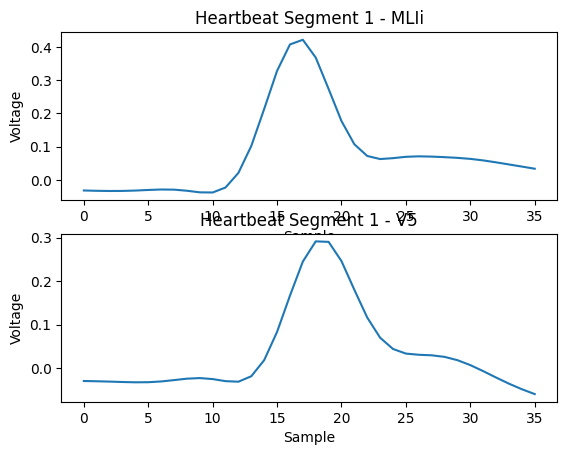

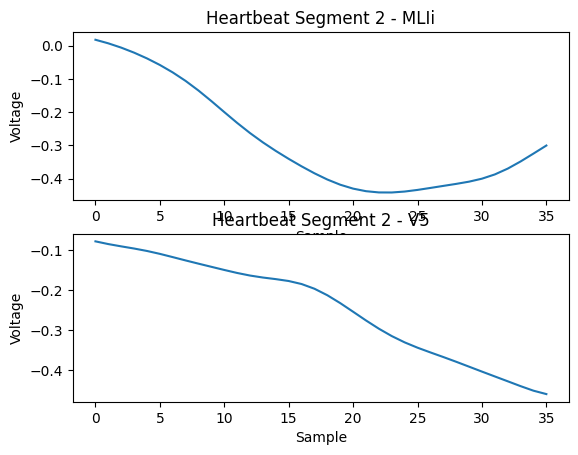

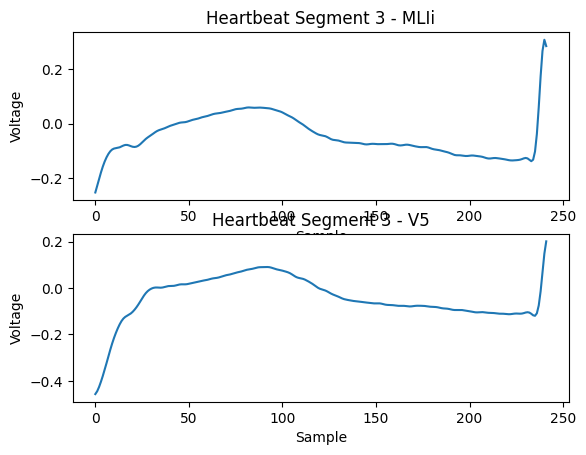

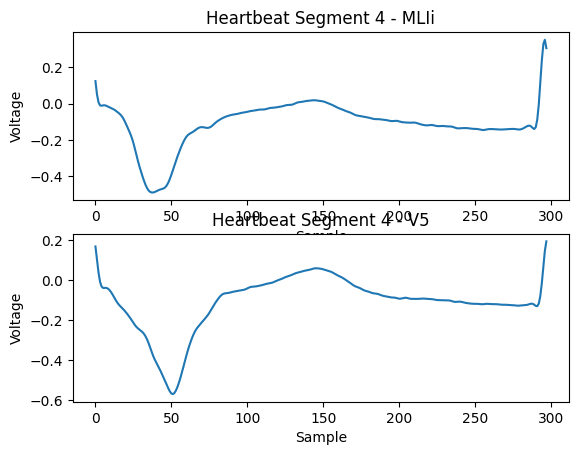

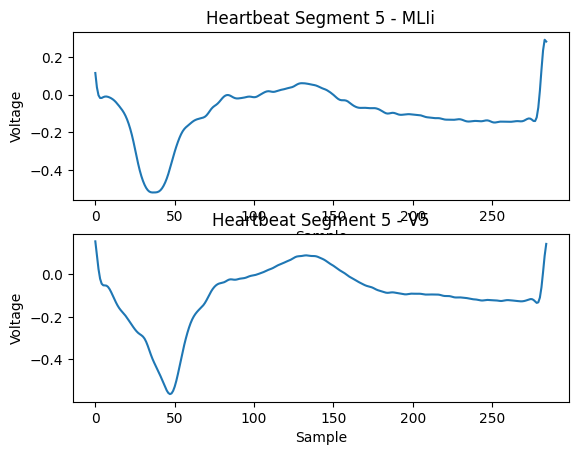

...

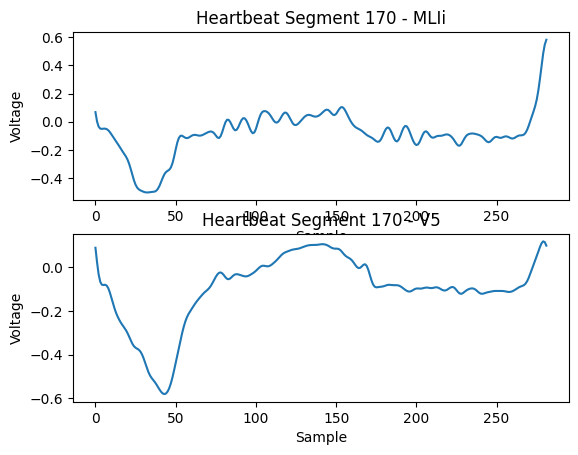

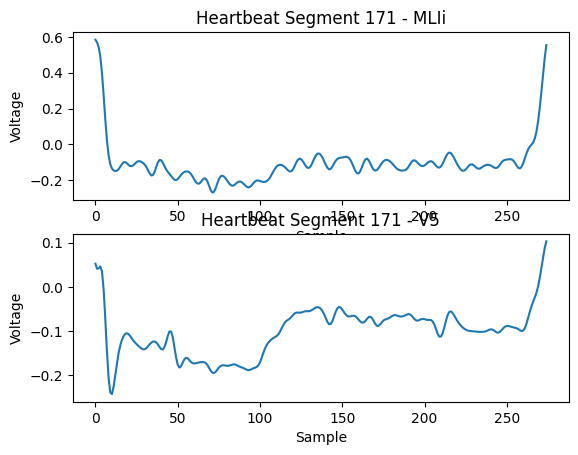

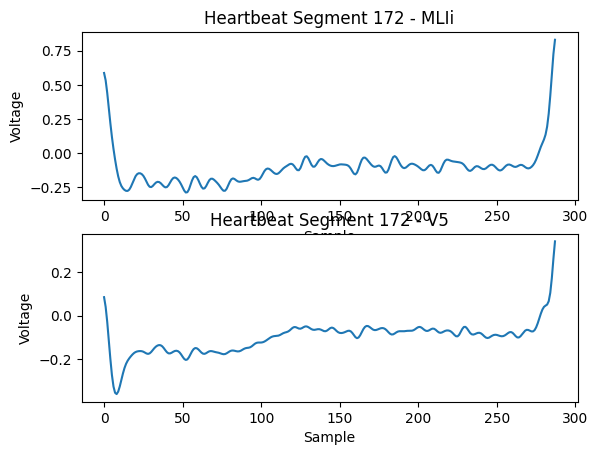

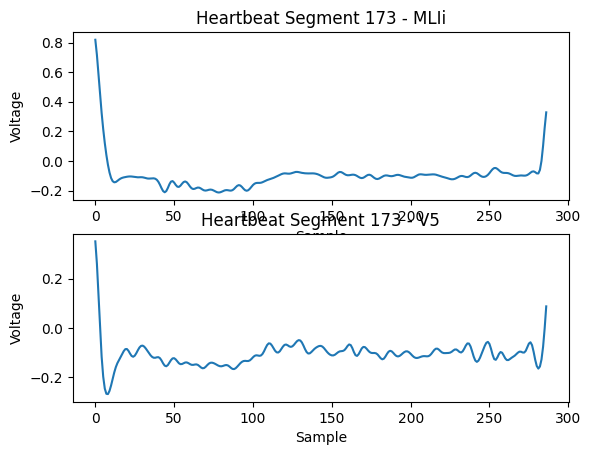

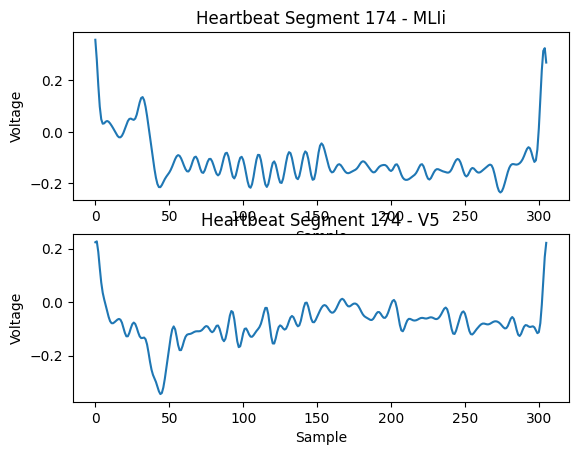

KeyboardInterrupt: ignored

In [17]:
# Iterate over each heartbeat segment in train_data
for i, heartbeat_segment in enumerate(train_data):
    # Create a new figure and subplot for each segment
    plt.figure()
    plt.subplot(2, 1, 1)

    # Plot the MLIi channel (first column)
    plt.plot(heartbeat_segment[:, 0])
    plt.title(f"Heartbeat Segment {i+1} - MLIi")
    plt.xlabel("Sample")
    plt.ylabel("Voltage")

    plt.subplot(2, 1, 2)

    # Plot the V5 channel (second column)
    plt.plot(heartbeat_segment[:, 1])
    plt.title(f"Heartbeat Segment {i+1} - V5")
    plt.xlabel("Sample")
    plt.ylabel("Voltage")

plt.show()


<ipython-input-19-c299642287c5>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


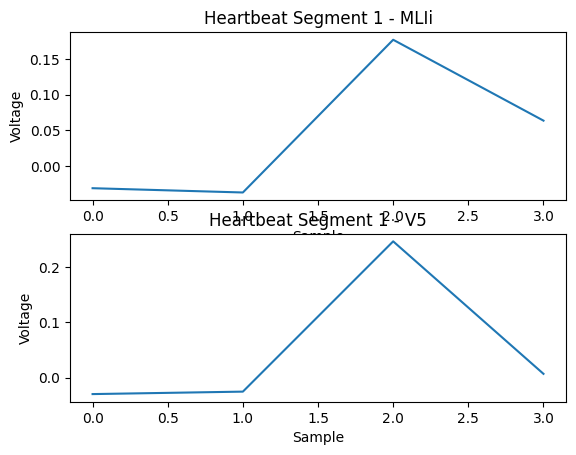

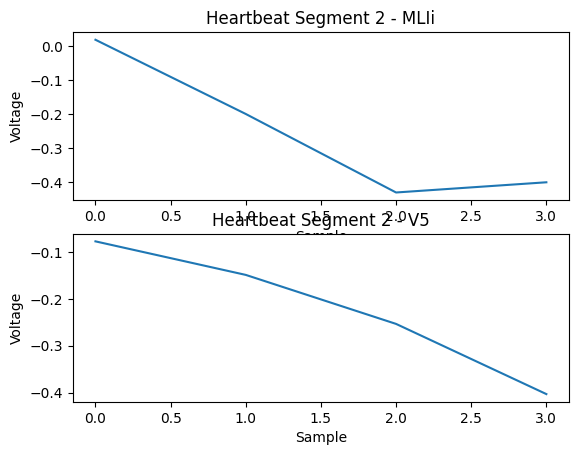

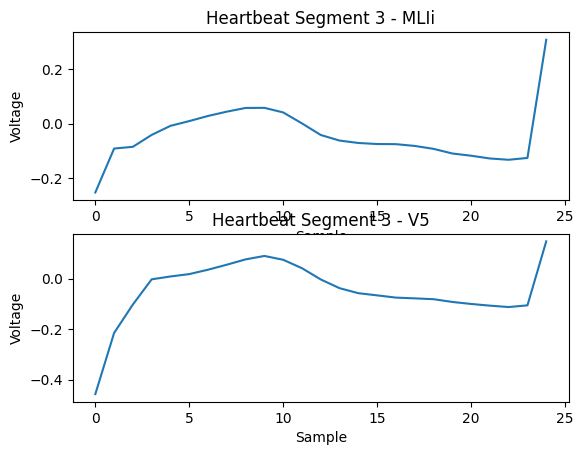

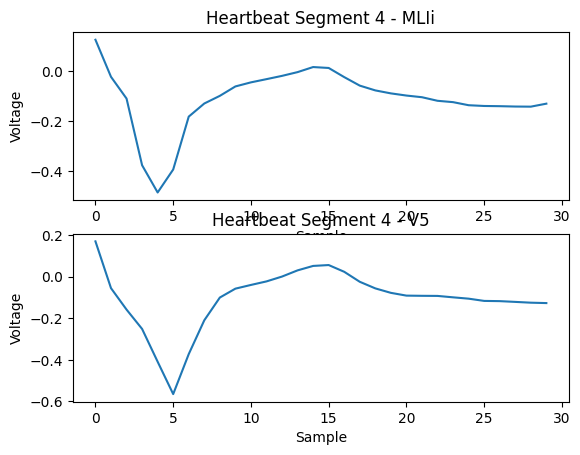

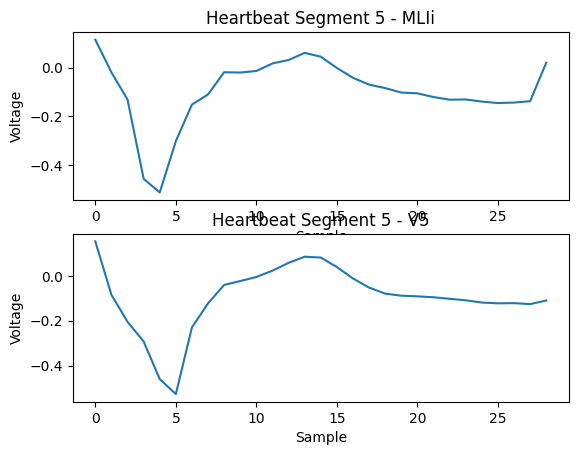

...

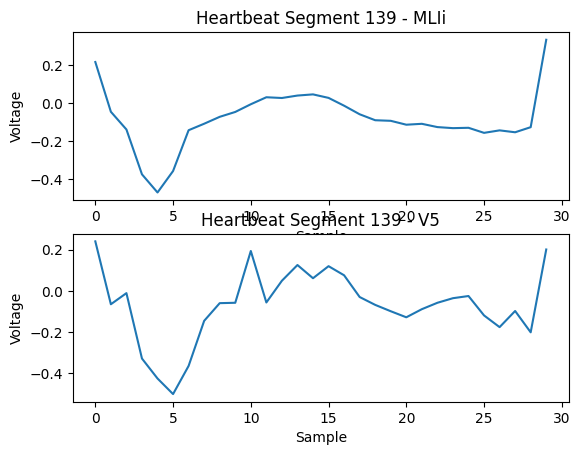

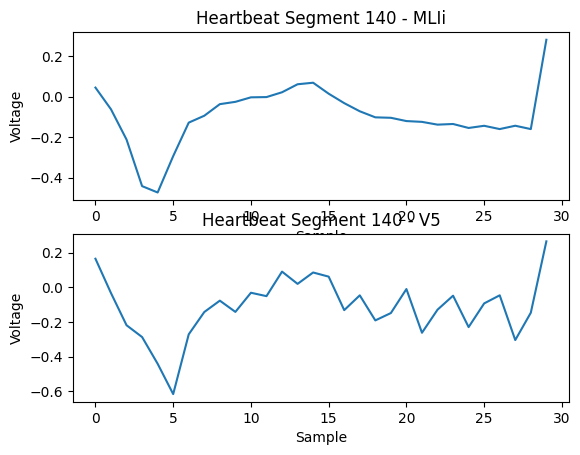

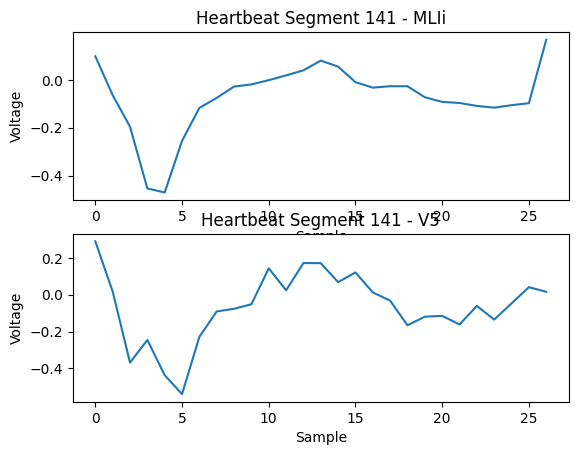

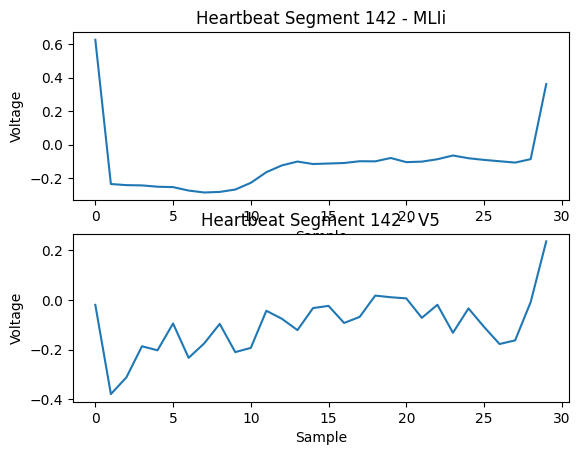

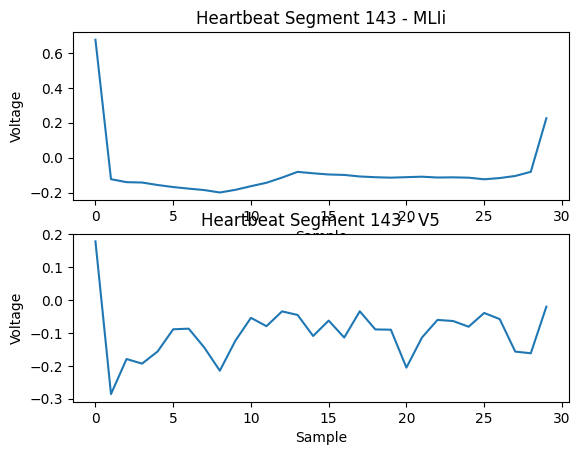

KeyboardInterrupt: ignored

In [19]:
# Iterate over each heartbeat segment in train_data
for i, heartbeat_segment in enumerate(train_data):
    # Decimate the heartbeat segment to the desired sampling rate
    decimated_segment = heartbeat_segment[::10]  # Decimate by selecting every 10th sample

    # Create a new figure and subplot for each segment
    plt.figure()
    plt.subplot(2, 1, 1)

    # Plot the decimated MLIi channel (first column)
    plt.plot(decimated_segment[:, 0])
    plt.title(f"Heartbeat Segment {i+1} - MLIi")
    plt.xlabel("Sample")
    plt.ylabel("Voltage")

    plt.subplot(2, 1, 2)

    # Plot the decimated V5 channel (second column)
    plt.plot(decimated_segment[:, 1])
    plt.title(f"Heartbeat Segment {i+1} - V5")
    plt.xlabel("Sample")
    plt.ylabel("Voltage")

plt.show()


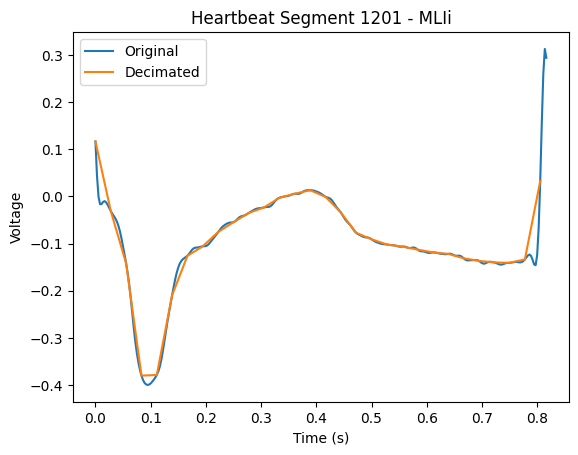

In [23]:
# Select a specific heartbeat segment for analysis
heartbeat_index = 1200
heartbeat_segment = train_data[heartbeat_index]

# Decimate the heartbeat segment to the desired sampling rate
decimated_segment = heartbeat_segment[::10]  # Decimate by selecting every 10th sample

# Create a time axis for plotting
original_time = np.arange(len(heartbeat_segment)) / 360.0  # Original sampling rate of 360 samples per second
decimated_time = np.arange(len(decimated_segment)) / 36.0  # Decimated sampling rate of 36 samples per second based on sampling rate

# Plot the original and decimated waveforms
plt.plot(original_time, heartbeat_segment[:, 0], label='Original')
plt.plot(decimated_time, decimated_segment[:, 0], label='Decimated')
plt.title(f"Heartbeat Segment {heartbeat_index+1} - MLIi")
plt.xlabel("Time (s)")
plt.ylabel("Voltage")
plt.legend()

plt.show()
